# UM Projekt

Darstellung und Vorhersage der Temperatur in Köln.

> Vorerst nur an einem Ort, wenn mehr Zeit vorhanden ist, kann man das noch erweitern

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np
import plotly.io as pio
from prophet import Prophet
from datetime import datetime, timedelta
import requests
import folium
import kaleido

pio.templates.default = "plotly_white" 


d:\Programmierung\Hochschule\UM\repo\OpenSenseMap-Projekt\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [9]:
past_year_data = pd.read_csv("daten/opensensemap_org-download-Temperatur-lat-lon-boxName-boxId-unit-value-createdAt-20240608_122410.csv")

## Box Information

In [3]:
# Box we want to investigate
box_id = "63cbcc462b62690008f2fe1e"

# Data request for box information
url = f'https://api.opensensemap.org/boxes/{box_id}?format=json'

response = requests.get(url)
response = response.json()

# Getting temperature sensor _id
sensors = response["sensors"]

for sensor in sensors:
    if sensor["unit"] == "°C":
        sensor_id = sensor["_id"]
        break

# Data structure for df
box_data = [[response["_id"], response["name"], response["currentLocation"]["coordinates"], sensor_id]]
columns = ["ID", "Name", "Coordinates", "Temperature_sensor_id"]

box_info = pd.DataFrame(box_data, columns=columns)


In [3]:
box_info

,ID,Name,Coordinates,Temperature_sensor_id
0,63cbcc462b62690008f2fe1e,CGN-Sensor,"[6.940945, 50.9399, 49]",63cbcc462b62690008f2fe21


### Ort von Box in Deutschland

In [28]:
lat = box_info["Coordinates"][0][1]
lon = box_info["Coordinates"][0][0]

map_ = folium.Map(location=[lat, lon], zoom_start=15)
folium.Marker(
    location=[lat, lon],
    popup=f"{box_info.at[0, 'Name']} (ID: {box_info.at[0, 'ID']})",
    tooltip=box_info.at[0, 'Name']
).add_to(map_)

map_.save("map.html")



## Historie von Box

(Eine Woche in Vergangenheit)

In [15]:
# Getting the dates for past week
end_date = datetime.utcnow()
start_date = end_date - timedelta(days=7)

end_date_str = end_date.isoformat() + 'Z'
start_date_str = start_date.isoformat() + 'Z'

file_ending_today = str(end_date.date())

# Request
url = f'https://api.opensensemap.org/boxes/{box_info["ID"][0]}/data/{box_info["Temperature_sensor_id"][0]}?from-date={start_date_str}&to-date={end_date_str}'

response = requests.get(url)
response = response.json()


In [20]:
past_week_temperature = pd.DataFrame(response).drop("location", axis=1)

# Adjust dtypes
past_week_temperature['createdAt'] = pd.to_datetime(past_week_temperature['createdAt'])
past_week_temperature["value"] = pd.to_numeric(past_week_temperature["value"])

# New index
past_week_temperature = past_week_temperature.set_index("createdAt")

# Resample
past_week_temperature = past_week_temperature.resample('h').mean()
past_week_temperature["value"] = past_week_temperature["value"].round(1)

past_week_temperature.to_csv(f"Daten/past_week/past_week_{file_ending_today}.csv")

In [21]:
layout = {
    "xaxis_title": "Datum",
    "yaxis_title": "Temperatur in Grad Celsius",
    "title": "Temperaturen der vergangenen Woche in Köln",
    "width": 1500,
    "height": 500
} 
graph_output_path = f"graphs-static/past_week/{file_ending_today}.html"

fig = px.line(past_week_temperature).update_layout(layout)
# pio.write_html(fig, graph_output_path)

fig.show()

In [71]:
str(end_date.date())

'2024-06-20'

## Historie von Box

(Für Training)

In [12]:
px.line(past_year_data, x="createdAt", y="value", title="Beispiel Visualisierung").update_layout(xaxis_title="Zeitstempel", yaxis_title="Temperatur in Grad Celsius")

Untersuchen von fehlenden Werten

In [14]:
past_year_data.isnull().sum()

lat          0
lon          0
boxName      0
boxId        0
unit         0
value        0
createdAt    0
dtype: int64

Aggregation der Werte um Datenvolumen zu reduzieren (Auf einen Wert pro Stunde)

In [19]:
temperature_agg = past_year_data.copy()
temperature_agg["createdAt"] = pd.to_datetime(temperature_agg["createdAt"])

temperature_agg.set_index("createdAt", inplace=True)
temperature_agg = temperature_agg["value"].resample('h').mean() 
temperature_agg = temperature_agg.to_frame().reset_index()

In [26]:
px.line(temperature_agg, x="createdAt", y="value", title="Beispiel Visualisierung aggregierter Daten").update_layout(xaxis_title="Zeitstempel", yaxis_title="Temperatur in Grad Celsius")


Beim Downsampling entstehen missing values. Vermutlich gibt es einige Stunden in denen die Box ausgeschaltet war. Von hier an verwenden wir nur noch die Daten bis März 2024, denn dort tritt ein großes Datenleck auf

Fehlende Werte mit Interpolation füllen.

In [21]:
temperature_agg.isnull().sum()

createdAt      0
value        591
dtype: int64

Vor der Interpolation, entfernen der Ausreißer mittels Shift-Vergleich

In [22]:
# Temperaturunterschied jetzt und letzte Stunde
temperature_agg['value_diff'] = temperature_agg['value'] - temperature_agg['value'].shift(1)

# Wenn größer als 10, aktueller Wert auf NaN setzen
temperature_agg.loc[(temperature_agg['value_diff'].abs() > 10) | (temperature_agg['value'] == -143.42), 'value'] = np.nan # -143.42 ist auch ein Fehl-Wert

temperature_agg.drop(columns=['value_diff'], inplace=True)

In [23]:
# Interpolation
temperature_agg['value'] = temperature_agg['value'].interpolate(method='linear')

In [24]:
# Begrenzung der Zeitreihe auf 01.03.2024
temperature_agg = temperature_agg[temperature_agg["createdAt"].dt.tz_localize(None) <= pd.Timestamp('2024-03-1')]

## Das Modell

### Zeitreihe

In [28]:
px.line(temperature_agg, x="createdAt", y="value", title="Beispiel Visualisierung aggregierter Daten").update_layout(xaxis_title="Zeitstempel", yaxis_title="Temperatur in Grad Celsius")


In [306]:
df = temperature_agg.copy()
def make_features(df):
    df = df.copy()
    # Create lag features, up to 5 days back
    for i in range(1,3):
        df[f"t-{i*24}"] = df["value"].shift(+i*24)
    
    # Rolling mean feature
    df["prev_24h"] = df[["value"]].rolling(24).mean().shift()
    
    return df
    
df = make_features(df)

In [307]:
px.line(df, x="createdAt", y=["value", "prev_24h"]).update_layout(yaxis_title="Temperatur in Celsius", xaxis_title="Datum", title="Veranschaulichung von gleitendem Mittelwert")

In [308]:
corr_matrix = df.drop("createdAt", axis=1).corr()

# Heatmap for correlation of temperature with lagged temperature
fig = px.imshow(
    corr_matrix,
    text_auto=True, 
    labels={'color': 'Correlation'},
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    color_continuous_scale='Viridis'
)

fig.update_layout(
    title='Korrelationsplot',
    xaxis_title='Features',
    yaxis_title='Features'
)

fig.show()

### Modell

Koeffizienten:  [0.41708548 0.10196603 0.47599013]  Intercept:  0.12455659638937178
Mean Squared Error:  8.55142473903039


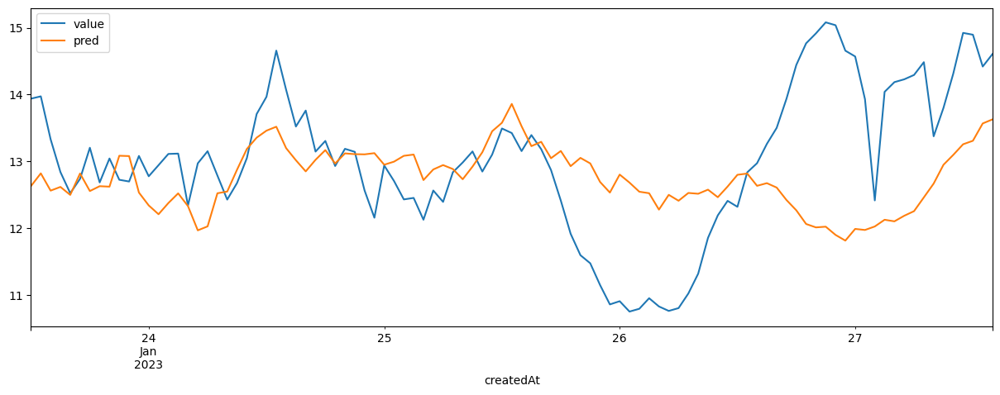

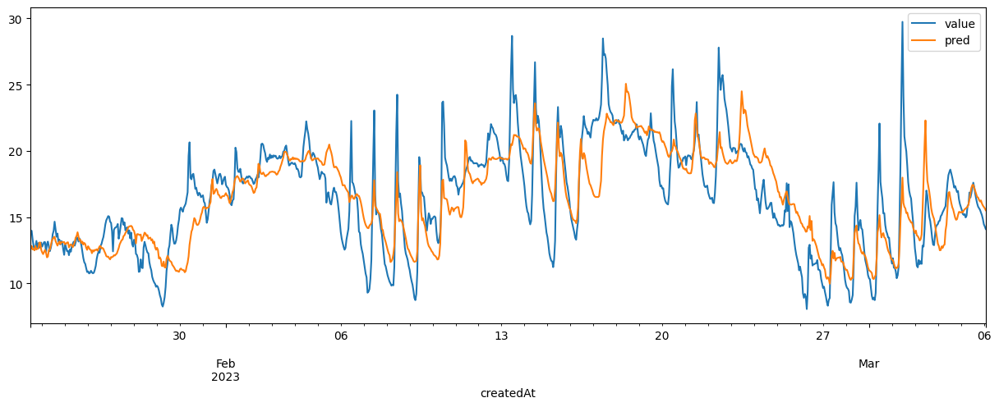

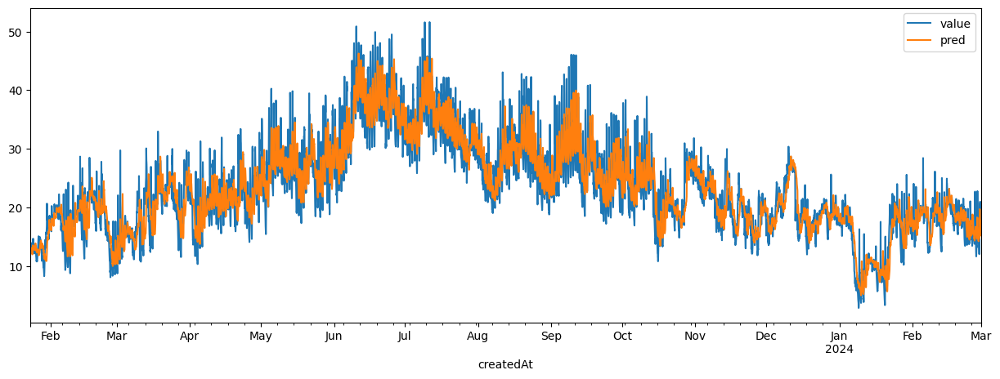

In [310]:
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

def trainLM(df, mkplot=True):
    df = df.copy().set_index("createdAt")
    df.dropna(inplace=True)
    
    X = df.loc[:, df.columns != 'value'] # Use all columns except 'value' as inputs
    
    y = df.value
    model = LinearRegression().fit(X, y)
    eval_df = df[['value']].copy()
    eval_df['pred'] = model.predict(X)
    print('Koeffizienten: ', model.coef_,' Intercept: ',model.intercept_)
    print("Mean Squared Error: ",mean_squared_error(eval_df.value, eval_df.pred))
    if mkplot:
        eval_df.iloc[1:100].plot(figsize=(15,5))
        eval_df.iloc[1:1000].plot(figsize=(15,5))
        eval_df.plot(figsize=(15,5))
        
    return model

model = trainLM(df)

### Vorhersage

In [311]:
past_week_temperature = pd.read_csv("daten/past_week/past_week_2024-06-21.csv")
past_week_temperature = make_features(past_week_temperature).dropna()
past_week_temperature["createdAt"] = pd.to_datetime(past_week_temperature["createdAt"])
past_week_temperature.set_index("createdAt", inplace=True)
backup_past_week = past_week_temperature.copy()
target = past_week_temperature.pop("value")
features = ["t-24", "t-48", "prev_24h"]


In [479]:
# Initialize DataFrame for forecasted values
forecast_horizon = 72  # Forecast 72 hours into the future
forecast_start_date = past_week_temperature.index[-1] + pd.Timedelta(hours=1)  # Start forecasting from the next hour

forecast_df = pd.DataFrame(index=pd.date_range(start=forecast_start_date, periods=forecast_horizon, freq='h'), columns=["t-24", "t-48", "prev_24h"])
forecast_df = pd.concat([backup_past_week, forecast_df])

forecast_df.rename({"value":"predict"}, axis=1, inplace=True)




C:\Users\Lars\AppData\Local\Temp\ipykernel_28392\1596541987.py:6: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [480]:
# Iteratively building the future 72h forecast
# Since we use features that would require to know for example for predicting t+25 the value of our prediction of t+1 (t+25-24)
# We have to use this for-loop to build it sequentially

current_index = len(forecast_df) - forecast_horizon

for timestep in range(1, forecast_horizon+1):
    
    # updating features in temporary columns   
    for i in range(1,3):
        forecast_df[f"t-{i*24}_2"] = forecast_df["predict"].shift(+i*24)

    forecast_df["prev_24h_2"] = forecast_df[["predict"]].rolling(24).mean().shift()

    # moving updated feature values into actual feature columns
    for i in features:
        forecast_df[i] = np.where(forecast_df[i].isna(), forecast_df[f"{i}_2"], forecast_df[i])
        
    # prediction
    forecast_df.iloc[current_index, 0] = model.predict(forecast_df.iloc[current_index:current_index+1][features]) # First Value to predict
    
    current_index += 1


In [500]:
px.line(forecast_df, x=forecast_df.index, y="predict", ).add_vline(x=forecast_df.index[-forecast_horizon], line_dash="dash").update_layout(xaxis_title="Datum", yaxis_title="Temperatur in Celsius", title="Temperaturvorhersage")

Wie man sehen kann, kann das Modell nicht das volle Ausmaß der Tagestief- und hochpunkte der Temperaturen erfassen. Jedoch scheint es das tägliche Muster gut erfasst zu haben. Je weiter wir in die Zukunft gehen, desto homogener werden die vorhergesagten Werte, das liegt daran, dass die Vorhersagen ab 25 Stunden auf den eigenen Vorhersagen vom Modell aufbauen. Diese homogenisierung der Vorhersagen geht Hand in Hand mit der Unsicherheit der Vorhersage.